## SCODA install
pip install scoda-tk

### install required packages

In [ ]:
!pip install scanpy
!pip install anndata
!pip install scoda-tk

### Upload processed file

In [ ]:
from google.colab import files

uploaded = files.upload()
os.listdir()

In [1]:
import time, os, copy, datetime, math, random, warnings
import numpy as np
import pandas as pd
import scanpy as sc
import anndata

# from scoda.icnv import run_icnv, identify_tumor_cells, plot_td_stats
# from scoda.icnv import clustering_alg, extend_major_clusters, initially_detect_major_clusters
# from scoda.cpdb import cpdb4_run, cpdb4_get_results, cpdb_plot, cpdb_get_gp_n_cp #, plot_circ
# from scoda.gsea import select_samples, run_enrich, run_enrichr, run_prerank
# from scoda.deg import deg_multi, get_population, plot_population
# from scoda.misc import plot_sankey_e, get_opt_files_path
# from scoda.hicat import HiCAT, show_summary, get_markers_major_type
# from scoda.hicat import get_markers_cell_type, get_markers_minor_type2, load_markers_all

from scoda.pipeline import scoda_hicat, scoda_icnv_addon, scoda_cci, scoda_deg_gsea
from scoda.pipeline import scoda_all_in_one

https://github.com/combio-dku


In [7]:
warnings.filterwarnings('ignore') 

### Load data & Set experiment parameters

In [2]:
file_h5ad, species = 'BRCA_minsoo_v03.h5ad', 'human'
# file_h5ad, species = 'BRCA_minsoo_v03_ds2.h5ad', 'human'
# file_h5ad, species = 'BRCA_minsoo_v03_ds4.h5ad', 'human'
# file_h5ad, species = 'BRCA_minsoo_for_test.h5ad', 'human'
# file_h5ad, species = 'brca_8k_csv.h5ad', 'human'
# file_h5ad, species = 'brca_8k.h5ad', 'human'
file_h5ad, species = '10x_multi_test_new.h5ad', 'mouse'

### Load data #####
adata_t = anndata.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 28775 × 32285
    obs: 'sample', 'condition', 'species', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'tumor_dec', 'tumor_score', 'y_conf', 'y_conf_gmm', 'celltype_minor_rev'
    var: 'gene_ids', 'feature_types'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'cnv', 'cnv_addon_summary', 'cnv_ref_celltypes'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'cnv_addon_results'

## Checking out the results

In [12]:
import os, copy, warnings
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scoda.viz import get_population, plot_population, plot_population_grouped
from scoda.viz import plot_sankey_e, plot_pct_box, get_gsea_summary, plot_gsea_all
from scoda.viz import plot_cci_dot, plot_cci_circ, plot_cci_circ_m, get_markers_from_deg
from scoda.viz import cci_remove_common, cci_get_ni_mat, cci_get_df_to_plot
from scoda.viz import plot_cnv, plot_marker_exp, plot_deg, plot_gsea_res, plot_td_stats

warnings.filterwarnings('ignore') 

## celltype annotation
### UMAP

In [9]:
adata = adata_t[:,:]

## UMAP with celltype annotation, sample, condition
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata, n_top_genes = 2000) # , flavor = 'seurat_v3')

## PCA
N_pca = 15
sc.tl.pca(adata, svd_solver='arpack', n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca)
sc.tl.leiden(adata, resolution = 1)

sc.tl.umap(adata) 

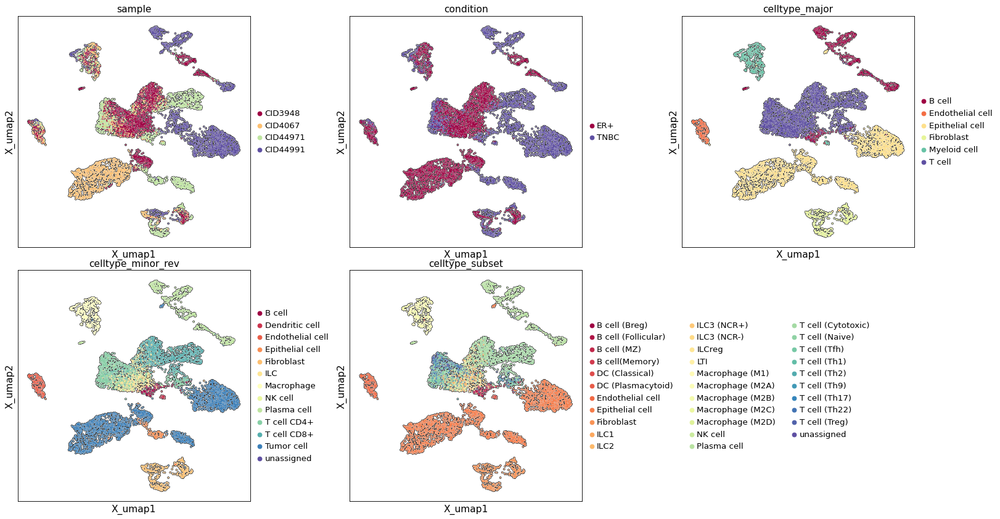

In [10]:
items_to_plot = ['sample', 'condition', 'celltype_major', 
                 'celltype_minor_rev', 'celltype_subset'] #, 'CD3D'] 

ws_hs = (0.3, 0.1)
# adata.obsm['X_umap'] = adata.obsm['X_org_umap']
sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                       color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 12, 
                       ncols = 3, palette = 'Spectral', return_fig = True, add_outline = True) 

plt.show()

### Cell Population

In [4]:
celltype_col = 'celltype_minor_rev'
if celltype_col not in list(adata_t.obs.columns.values):
    celltype_col = 'celltype_minor_rev'

df_cnt, df_pct= get_population( adata_t.obs['sample'], 
                                adata_t.obs[celltype_col], sort_by = [] )
df_cnt

,Dendritic cell,Endothelial cell,Epithelial cell,Fibroblast,ILC,Macrophage,Plasma cell,T cell CD4+,T cell CD8+,Tumor cell,unassigned
CID3948,2,72,11,65,432,98,200,455,446,219,0
CID4067,0,100,8,120,171,151,0,81,146,1223,0
CID44971,0,48,163,181,110,143,11,568,538,238,0
CID44991,0,14,21,83,16,59,417,181,102,1106,1


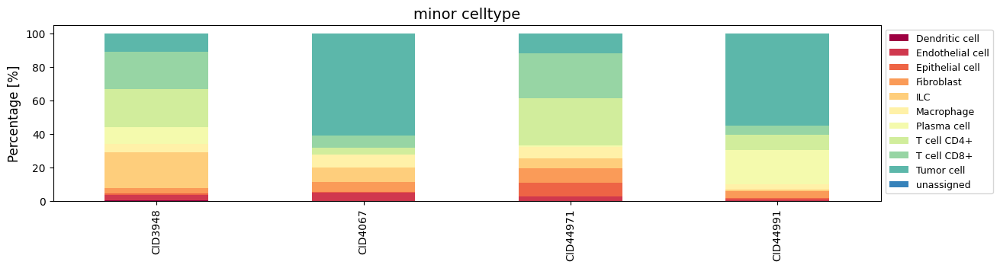

In [5]:
plot_population( df_pct, title = 'minor celltype', title_fs = 14, 
                 label_fs = 12, tick_fs = 10, tick_rot = 90,
                 legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                 legend_ncol = 1, cmap_name = None, figsize=(14, 3), return_fig = False)

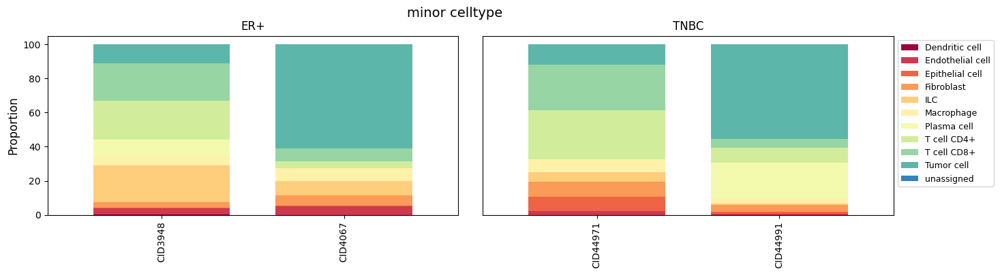

In [6]:
sg_map = {}
slst = list(df_cnt.index.values)
for s in slst:
    b = adata_t.obs['sample'] == s
    g = list(adata_t.obs.loc[b, 'condition'])[0]
    sg_map[s] = g
    
plot_population_grouped( df_pct, sg_map, sort_by = ['Tumor cell'], 
                         title = 'minor celltype', title_fs = 14, title_y = 1.1,
                         label_fs = 12, tick_fs = 10, tick_rot = 90,
                         legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                         legend_ncol = 1, cmap_name = None, figsize=(14, 3), return_fig = False)

In [7]:
## Tumor identification: UMAP, CNV heatmap, tumor markers, dotplot
lst = [adata_t.obs['celltype_minor'], adata_t.obs['celltype_major'], 
       adata_t.obs['tumor_dec'], adata_t.obs['celltype_minor_rev']]
plot_sankey_e( lst, title = None, fs = 13, WH = (800, 500), th = 10, title_y = 0.8 )
plt.show()

### Marker expression pattern

B cell (Follicular): 23 > 1, Macrophage (M2B): 39 > 2, T cell (Naive): 8 > 1, T cell (Treg): 22 > 11, B cell(Memory): 22 > 3, Fibroblast: 11 > 9, Endothelial cell: 20 > 19, Smooth muscle cell: 16 > 14, T cell (Th17): 16 > 1, Plasma cell: 10 > 5, Macrophage (M1): 40 > 3, T cell (Th22): 13 > 2, Macrophage (M2C): 44 > 6, Epithelial cell: 12 > 11, B cell (MZ): 14 > 3, T cell (Th1): 15 > 5, ILC1: 16 > 7, ILCreg: 10 > 3, T cell (Tfh): 20 > 8, Macrophage (M2D): 34 > 1, T cell (Th9): 9 > 1, B cell (Breg): 14 > 1, Macrophage (M2A): 48 > 6, ILC3 (NCR+): 13 > 0, DC (Classical): 36 > 6, T cell (Cytotoxic): 7 > 3, ILC2: 13 > 3, LTI: 15 > 5, DC (Inflammatory): 23 > 0, DC (Plasmacytoid): 29 > 8, T cell (Th2): 13 > 2, ILC3 (NCR-): 12 > 0, NK cell: 35 > 31
Num markers selected: 114 -> 114


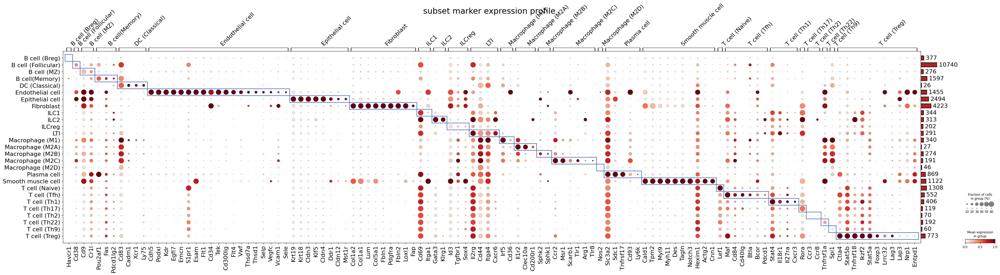

In [14]:
mkr_dict = copy.deepcopy( adata_t.uns['Celltype_marker_DB']['subset_markers_dict'] )
target_lst = list(adata_t.obs['celltype_subset'].unique())

title = 'subset marker expression profile  \n \n  \n \n '

pes, pexs, md = plot_marker_exp( adata_t, target_lst, 'celltype_subset', mkr_dict, title = title, 
                          rend = None, level = 0, cutoff = 0.05, pnsh12 = '100000', rem_cmn = True, 
                          dot_max = 0.6, fs_text = 16, swap_ax = False, to_exclude = [], 
                          comb_mkrs = False, vg_rot = 45, lw = 1.5, fs_title = 22, vg_hgt = 1.2, 
                          Npt = 20, Npt_tot = 200, ret_pe = True, legend = True,
                          type_level_g = None, other_genes = [], show_unassigned = False, 
                          add_rect = True, standard_scale = 'var', figsize = None )


### CNV & tumor cell identification

... storing 'tumor_dec_rev' as categorical
... storing 'chr' as categorical


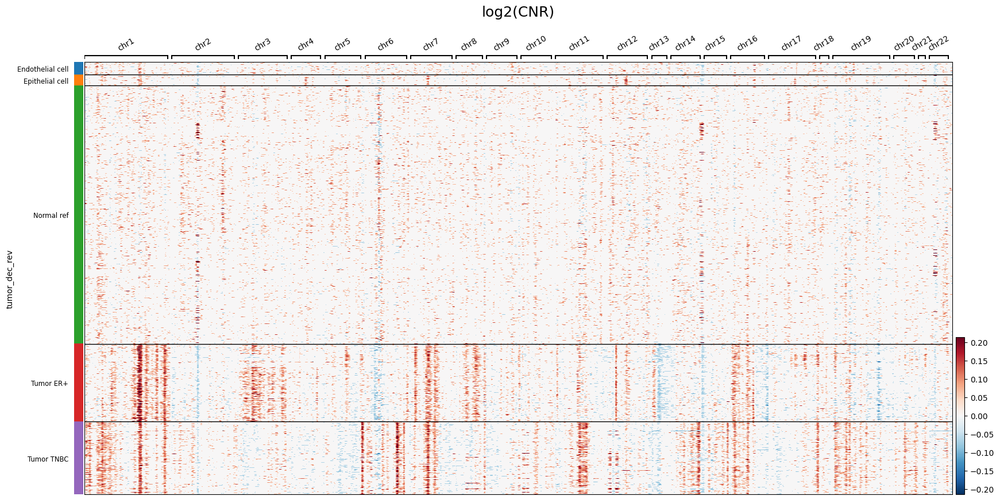

In [9]:
adata = adata_t[:,:]

cond_col = 'condition'
clst = adata.obs[cond_col].unique()
adata.obs['tumor_dec_rev'] = adata.obs['celltype_major'].copy(deep = True).astype(str)
b = adata.obs['tumor_dec_rev'].isin(adata.uns['cnv_ref_celltypes'])
adata.obs.loc[b, 'tumor_dec_rev'] = 'Normal ref'
for c in clst:
    b = (adata.obs[cond_col] == c) & (adata.obs['tumor_dec'] == 'Tumor')
    s = 'Tumor %s' % c
    adata.obs.loc[b, 'tumor_dec_rev'] = s

plot_cnv( adata, groupby = 'tumor_dec_rev', title_fs = 18, label_fs = 12,
          figsize = (20, 10), swap_axes = False, 
          var_group_rotation = 30, cmap='RdBu_r', vmax = 1)

### CNV UMAP

In [10]:
adata = adata_t[:,:]

N_pca = 15
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca, 
                use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')

ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)    
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

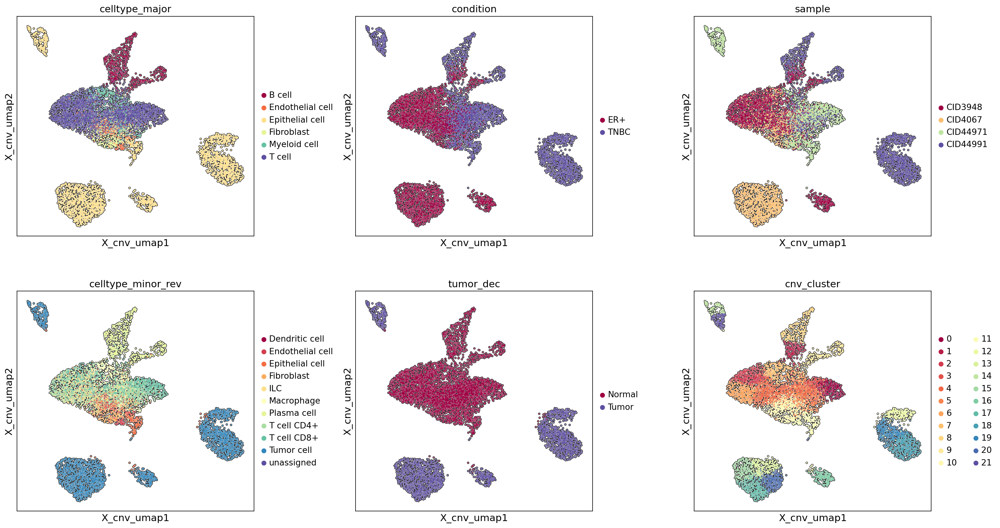

In [11]:
items_to_plot = ['celltype_major', 'condition', 'sample', 'celltype_minor_rev', 'tumor_dec', 'cnv_cluster'] 

sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.3, legend_fontsize = 12, ncols = 3, 
                       palette = 'Spectral', return_fig = False, add_outline = True) 
plt.show()

In [12]:
adata_t.uns['cnv_addon_summary'].keys()

dict_keys(['adj_mat', 'agg_adj_mat', 'cnv_cluster_info', 'connectivity_threshold', 'tumor_dec_params'])

In [13]:
adata_t.uns['cnv_addon_summary']['cnv_cluster_info']

,cmean,ref_frac,tumor_dec,cluster_size,cluster_score,seed,selected,selection_order,paired_cluster,edge_wgt,threshold
cnv_cluster,,,,,,,,,,,
0,-5.411242,1,Normal,318,0.799941,True,True,7,3,61.5,0.193396
1,-7.963124,1,Normal,193,0.376179,True,True,10,8,22.9,0.118653
2,-6.588495,1,Normal,432,0.758731,True,True,5,6,64.3,0.148843
3,-6.343285,1,Normal,455,0.737807,True,True,4,5,124.7,0.274066
4,-7.212622,1,Normal,771,0.650607,True,True,0,10,93.2,0.171956
5,-7.372240,1,Normal,725,0.504929,True,True,1,3,124.7,0.274066
6,-6.694715,1,Normal,483,0.757569,True,True,3,4,81.0,0.167702
7,-7.343071,1,Normal,375,0.543516,True,True,6,2,44.2,0.117867
8,-9.943144,1,Normal,287,0.318105,True,True,8,1,22.9,0.118653


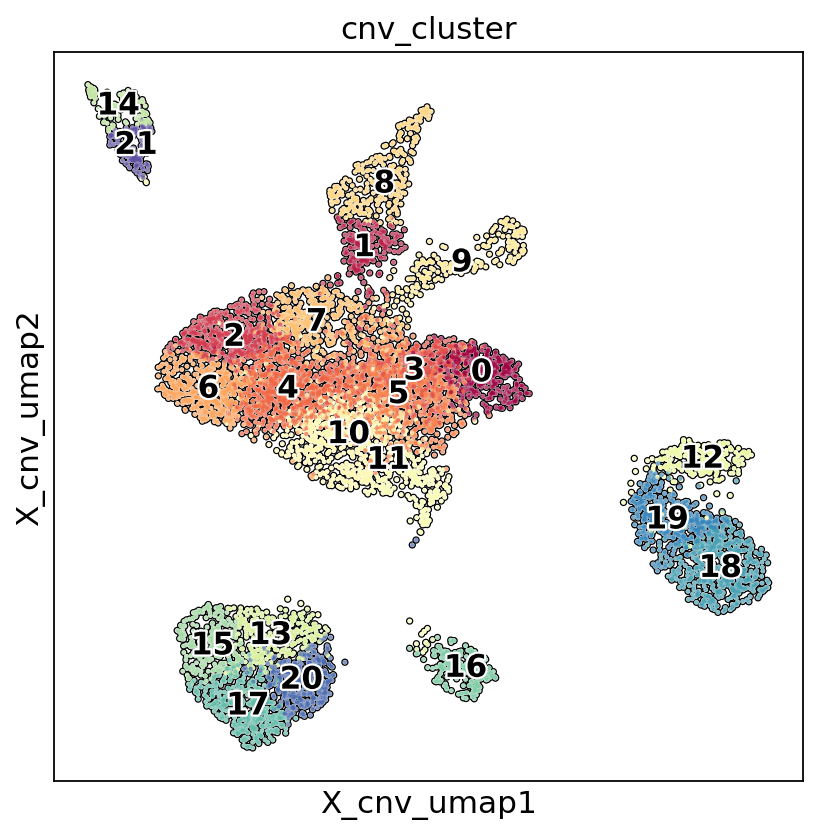

In [14]:
sc.pl.embedding( adata, basis = 'X_cnv_umap', add_outline = True, 
                 color="cnv_cluster", legend_loc="on data", legend_fontoutline=2)
plt.show()

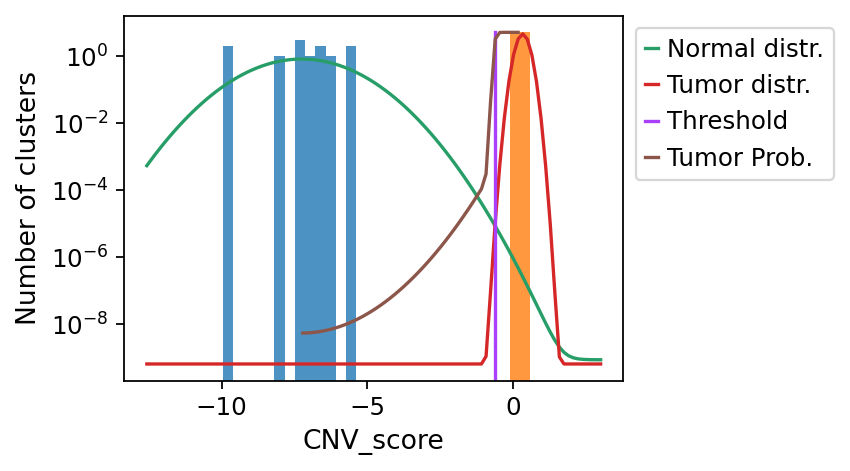

In [15]:
td_params = adata_t.uns['cnv_addon_summary']['tumor_dec_params']

plot_td_stats( td_params, n_bins = 30, title = None, title_fs = 14,
                label_fs = 12, tick_fs = 11, legend_fs = 11, 
                legend_loc = 'upper left', bbox_to_anchor = (1, 1),
                figsize = (4,3), log = True, alpha = 0.8 )

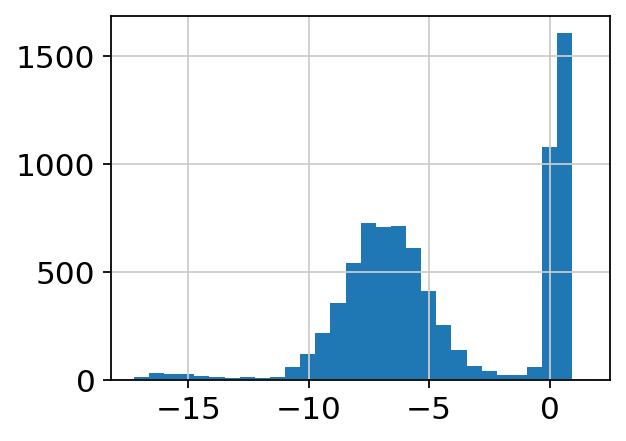

In [16]:
plt.figure(figsize = (4,3))
adata_t.obs['tumor_score'].hist(bins = 30)
plt.show()

### cell-cell interaction

In [17]:
df_dct = adata_t.uns['CCI']
cond_lst = list(df_dct.keys())
cond_lst

['ER+', 'TNBC']

In [20]:
df_dct['ER+']

,gene_pair,cell_pair,gene_A,gene_B,cell_A,cell_B,pval,mean
ADM_RAMP3--Endothelial cell|Endothelial cell,ADM_RAMP3,Endothelial cell|Endothelial cell,ADM,RAMP3,Endothelial cell,Endothelial cell,0.000,0.9515
ADM_RAMP3--Endothelial cell|Epithelial cell,ADM_RAMP3,Endothelial cell|Epithelial cell,ADM,RAMP3,Endothelial cell,Epithelial cell,0.004,0.1885
ADM_RAMP3--Fibroblast|Endothelial cell,ADM_RAMP3,Fibroblast|Endothelial cell,ADM,RAMP3,Fibroblast,Endothelial cell,0.000,0.4370
ADM_RAMP3--Fibroblast|Epithelial cell,ADM_RAMP3,Fibroblast|Epithelial cell,ADM,RAMP3,Fibroblast,Epithelial cell,0.068,0.0830
ADM_RAMP3--Macrophage|Endothelial cell,ADM_RAMP3,Macrophage|Endothelial cell,ADM,RAMP3,Macrophage,Endothelial cell,0.000,1.1140
...,...,...,...,...,...,...,...,...
integrin_aVb1_complex_ADGRE5--Fibroblast|T cell CD8+,integrin_aVb1_complex_ADGRE5,Fibroblast|T cell CD8+,integrin,aVb1,Fibroblast,T cell CD8+,0.000,0.3790
integrin_aVb1_complex_ADGRE5--Macrophage|ILC,integrin_aVb1_complex_ADGRE5,Macrophage|ILC,integrin,aVb1,Macrophage,ILC,0.000,0.3155
integrin_aVb1_complex_ADGRE5--Macrophage|Macrophage,integrin_aVb1_complex_ADGRE5,Macrophage|Macrophage,integrin,aVb1,Macrophage,Macrophage,0.000,0.1760
integrin_aVb1_complex_ADGRE5--Macrophage|T cell CD4+,integrin_aVb1_complex_ADGRE5,Macrophage|T cell CD4+,integrin,aVb1,Macrophage,T cell CD4+,0.012,0.2560


In [22]:
dfs_dct = cci_remove_common( df_dct )
df_lst = cci_get_ni_mat( dfs_dct, remove_common = False )

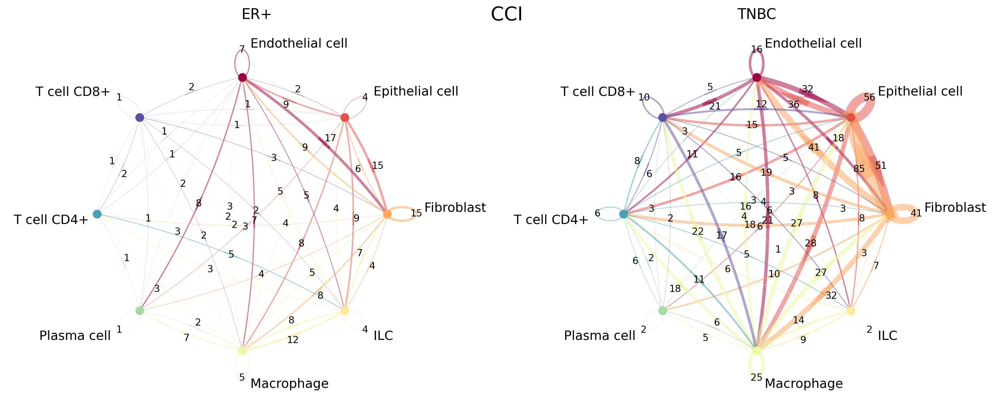

In [23]:
plot_cci_circ_m( df_lst, ncol = 2, figsize = (8,7), title = 'CCI', title_y = 1.02, 
                   title_fs = 24, text_fs = 16, num_fs = 12, margin = 0.08, alpha = 0.5, 
                   N = 500, R = 3, Rs = 0.1, lw_max = 20, lw_scale = 0.2, log_lw = False, 
                   node_size = 10, rot = False, cmap = 'Spectral', ws_hs = (0.35, 0.1) )

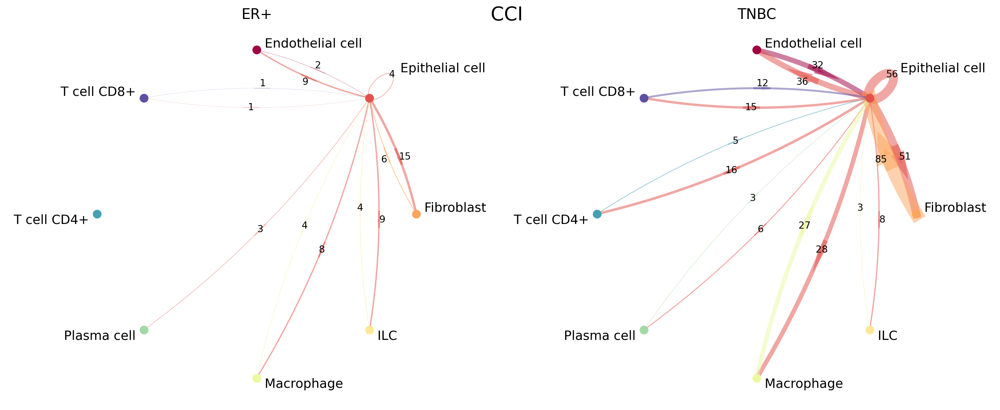

In [24]:
target = 'Epithelial cell'
df_lst2 = {}
for key in df_lst.keys():
    df = df_lst[key]
    msk = df.copy(deep = True)
    msk.loc[:,:] = 0
    msk.loc[target,:] = 1
    msk.loc[:,target] = 1
    df_lst2[key] = df*msk
    
plot_cci_circ_m( df_lst2, ncol = 2, figsize = (8,7), title = 'CCI', title_y = 1.02, 
                   title_fs = 24, text_fs = 16, num_fs = 12, margin = 0.08, alpha = 0.5, 
                   N = 500, R = 3, Rs = 0.1, lw_max = 20, lw_scale = 0.2, log_lw = False, 
                   node_size = 10, rot = False, cmap = 'Spectral', ws_hs = (0.35, 0.1) )

In [25]:
idx_dct = {}
for g in df_dct.keys():
    idx_dct[g] = list(df_dct[g].index.values)

idx1 = idx_dct['ER+']
idx2 = idx_dct['TNBC']
idxc = list(set(idx1).intersection(idx2))

len(idxc), len(idx1), len(idx2)

(669, 915, 1577)

'Union of Interactions: 645'

17 cell_pairs, 322 gene_pairs found


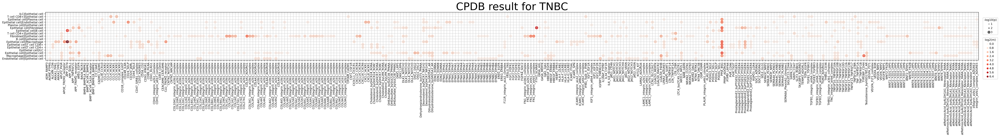

17 cell_pairs, 322 gene_pairs found


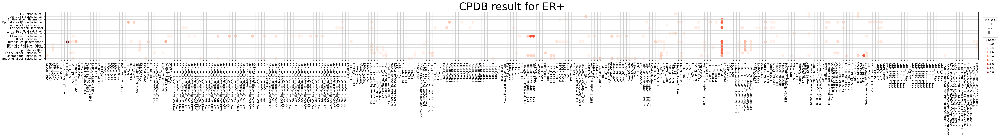

In [32]:
df_dct_to_plot = cci_get_df_to_plot( df_dct, target_cells = ['Epithelial cell'], 
                                     pval_cutoff = 0.01, mean_cutoff = 1 )

## CCI: circle plot, dotplot, pairwise venn diagram
for g in df_dct_to_plot.keys():
    
    dfv = df_dct_to_plot[g]
    idxs = list(dfv.index.values)
    
    dfs = dfv.sort_values(by = ['gene_pair', 'cell_pair'])
    
    ax = plot_cci_dot( dfs, mkr_sz = 9, tick_sz = 9, 
                       legend_fs = 9, title_fs = 34, dpi = 120,
                       title = 'CPDB result for %s' % g, swap_ax = True )

### DEG

In [26]:
adata_t

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'Patient', 'Percent_mito', 'nCount_RNA', 'nFeature_RNA', 'celltype_major', 'celltype_minor', 'celltype_subset', 'subtype', 'gene_module', 'Calls', 'normal_cell_call', 'CNA_value', 'sample', 'condition', 'cnv_cluster', 'tumor_dec', 'tumor_score', 'y_conf', 'y_conf_gmm', 'celltype_minor_rev'
    var: 'gene_ids'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'cnv', 'cnv_addon_summary', 'cnv_ref_celltypes'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'cnv_addon_results'

In [27]:
nc_deg_dct = adata_t.uns['DEG_stat']
df_deg_dct = adata_t.uns['DEG']
df_deg_dct.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'ILC', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [28]:
target_cell = 'Epithelial cell'

df_deg = df_deg_dct[target_cell]
nc_deg = nc_deg_dct[target_cell]

nc_deg

{'ER+_vs_others': {'ER+': 690, 'others': 861},
 'TNBC_vs_others': {'TNBC': 861, 'others': 690}}

In [29]:
df_deg.keys()

dict_keys(['ER+_vs_others', 'TNBC_vs_others'])

In [30]:
df_deg['TNBC_vs_others']

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,Rp
MARCKS,4.745000,2.495352e-148,2.775830e-144,0.837953,0.047754,0.684088,0.052174,0.614567,0.684
CD82,3.959000,2.443390e-146,2.718027e-142,0.902151,0.090038,0.735192,0.104348,0.589765,0.735
LMO4,4.298000,1.546141e-111,1.719927e-107,0.822684,0.062860,0.630662,0.055072,0.563111,0.631
BACE2,3.712000,6.442993e-111,7.167185e-107,0.812162,0.091286,0.670151,0.089855,0.555129,0.670
DNAJC15,3.302000,2.653609e-110,2.951875e-106,0.706858,0.099130,0.679443,0.108696,0.539765,0.679
...,...,...,...,...,...,...,...,...,...
NKX2-2,-30.562000,1.341011e-23,1.491741e-19,0.000000,0.147188,0.000000,0.137681,0.000000,0.000
LINC01117,-29.042999,9.623986e-13,1.070572e-08,0.000000,0.053835,0.000000,0.072464,0.000000,0.000
BFSP2-AS1,-30.344999,1.236511e-18,1.375495e-14,0.000000,0.127829,0.000000,0.105797,0.000000,0.000
HOXD8,-29.159000,6.827809e-13,7.595255e-09,0.000000,0.058224,0.000000,0.073913,0.000000,0.000


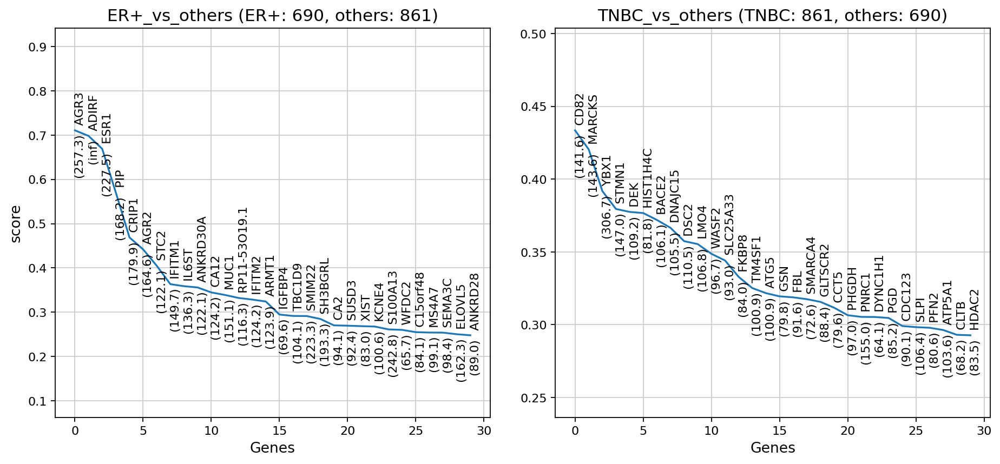

In [31]:
for k in df_deg.keys():
    df_deg[k]['score'] = df_deg[k]['nz_pct_score']*df_deg[k]['Rp']

plot_deg( df_deg, value = 'score', n_genes = 30, pval_cutoff = 0.05, 
          figsize = (6,5), text_fs = 10, title_fs = 14, label_fs = 12, 
          tick_fs = 10, ncol = 2, ws_hs = (0.15, 0.2), deg_stat_dct = nc_deg )
    

In [32]:
mkr_dict = get_markers_from_deg( df_deg, N_mkrs = 30, rem_common = True )

## Print results   
for key in mkr_dict.keys():
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])        


ER+ (30):  ['ANKRD30A', 'C15orf48', 'ELOVL5', 'SH3BGRL', 'S100A13', 'IFITM1', 'CA12', 'ADIRF', 'SEMA3C', 'SUSD3', 'KCNE4', 'STC2', 'ANKRD28', 'SMIM22', 'IGFBP4', 'IL6ST', 'IFITM2', 'PIP', 'CA2', 'ARMT1', 'MUC1', 'RP11-53O19.1', 'WFDC2', 'MS4A7', 'CRIP1', 'XIST', 'TBC1D9', 'ESR1', 'AGR3', 'AGR2']
TNBC (30):  ['HDAC2', 'DYNC1H1', 'HIST1H4C', 'SLPI', 'CLTB', 'CD82', 'DNAJC15', 'TM4SF1', 'ATP5A1', 'CCT5', 'PNRC1', 'SMARCA4', 'GSN', 'YBX1', 'CDC123', 'PFN2', 'SLC25A33', 'PHGDH', 'GLTSCR2', 'WASF2', 'FBL', 'DSC2', 'STMN1', 'ATG5', 'BACE2', 'PGD', 'DEK', 'LMO4', 'MARCKS', 'FKBP8']


In [33]:
## Select cells
target_cell = 'Epithelial cell'

adata_s = adata_t[:,:]
b1 = adata_s.obs['celltype_minor'] == target_cell
b2 = adata_s.obs['tumor_dec'] != 'unclear'
b = b1 # & b2

adata_s = adata_s[b,:]

In [34]:
## Assign new sample name with subtype prefix
subtype_field = 'cond_new'
adata_s.obs[subtype_field] = adata_s.obs[cond_col].copy(deep = True).astype(str)
b = adata_s.obs['tumor_dec'] == 'Normal'
adata_s.obs.loc[b, subtype_field] = 'Normal'

slst = list(adata_s.obs[sample_col])
clst = list(adata_s.obs[cond_col])
tlst = list(adata_s.obs[subtype_field])

plst2 = []
for s, c, t in zip(slst, clst, tlst):
    plst2.append('%s - %8s - %s' % (t, c, s))
        
pid_field = 'pid_e'
adata_s.obs[pid_field] = plst2

## Select samples with its No. of cells greater than 40
pcnt = adata_s.obs[pid_field].value_counts()
b = pcnt >= 200
plst = list(pcnt.index.values[b])

# display(pcnt[plst])
print('N_samples: ', len(plst), 'ave. N_cells: ', pcnt[plst].mean())

b = adata_s.obs[pid_field].isin(plst)
adata_ss = adata_s[b,:]

NameError: name 'sample_col' is not defined

In [55]:
adata_ss.obs['pid_e'].value_counts()

ER+ -      ER+ - CID4067      1225
TNBC -     TNBC - CID44991    1117
TNBC -     TNBC - CID44971     242
ER+ -      ER+ - CID3948       224
Name: pid_e, dtype: int64

... storing 'cond_new' as categorical
... storing 'pid_e' as categorical


Num markers selected: 60 -> 60


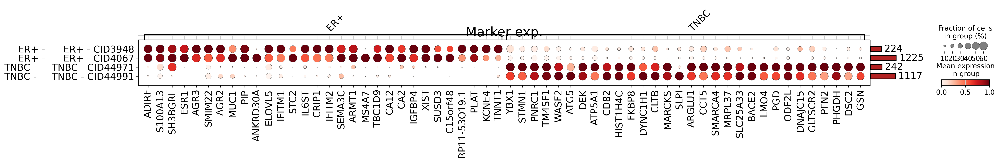

In [56]:
type_col = subtype_field 
target_lst = list(adata_ss.obs[subtype_field].unique())
target_lst.sort()
title = 'Marker exp.'

pes, pexs, md = plot_marker_exp( adata_ss, target_lst, type_col, mkr_dict, title = title, 
                          rend = None, level = 0, cutoff = 0.05, pnsh12 = '100000', 
                          rem_cmn = True, 
                          dot_max = 0.6, fs_text = 16, swap_ax = False, to_exclude = [], 
                          comb_mkrs = False, vg_rot = 45, lw = 1.5, fs_title = 22, vg_hgt = 1.2, 
                          Npt = 20, Npt_tot = 200, ret_pe = True, legend = True,
                          type_level_g = 'pid_e', other_genes = [], show_unassigned = False, 
                          add_rect = False, standard_scale = 'var', figsize = None )
plt.show()

### GSEA

In [57]:
df_dct_enr_up = adata_t.uns['GSA_up']
df_dct_enr_dn = adata_t.uns['GSA_down']
# df_dct_enrichr = adata_t.uns['GSA']

In [58]:
df_dct_enr_up.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [59]:
target_cell = 'Epithelial cell'
df_dct_enr_up[target_cell].keys()

dict_keys(['ER+_vs_others', 'TNBC_vs_others'])

In [60]:
df_res_enr = df_dct_enr_up[target_cell]['TNBC_vs_others']
df_res_enr

,Gene_set,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes,-log(p-val),-log(q-val),Term,Ind
Term,,,,,,,,,,
AGE-RAGE signaling pathway in diabetic complications,CUSTOM140417977387776,27/99,2.112510e-03,5.506378e-03,1.773398,CXCL8;TNF;PIM1;PRKCZ;COL1A1;CCND1;PIK3R1;TGFBR...,2.675201,2.259134,AGE-RAGE signaling pathway in diabetic complic...,1
AMPK signaling pathway,CUSTOM140417977387776,30/118,3.957231e-03,9.391041e-03,1.651512,PCK2;EIF4EBP1;AKT1S1;CCND1;PIK3R1;RPS6KB2;EEF2...,2.402609,2.027286,AMPK signaling pathway,1
Acute myeloid leukemia,CUSTOM140417977387776,21/67,9.668064e-04,2.820591e-03,2.043319,EIF4EBP1;PIM1;CEBPA;CCND1;PIK3R1;RPS6KB2;CCNA2...,3.014660,2.549660,Acute myeloid leukemia,1
Adherens junction,CUSTOM140417977387776,26/66,2.677354e-06,1.373224e-05,2.559235,PTPN1;YES1;TGFBR1;WASF2;FGFR1;RAC3;MAP3K7;RAC1...,5.572294,4.862259,Adherens junction,1
Adipocytokine signaling pathway,CUSTOM140417977387776,16/68,5.694294e-02,1.000434e-01,1.543515,PRKAG1;RXRB;NFKBIB;PCK2;NFKBIA;IKBKG;TNF;MTOR;...,1.244560,0.999812,Adipocytokine signaling pathway,1
...,...,...,...,...,...,...,...,...,...,...
Yersinia infection,CUSTOM140417977387776,40/134,2.395512e-05,1.002333e-04,1.935264,CXCL8;TNF;ACTR3;ROCK2;PIP5K1C;PIK3R1;RHOG;WASF...,4.620602,3.998988,Yersinia infection,1
beta-Alanine metabolism,CUSTOM140417977387776,8/30,8.453193e-02,1.394178e-01,1.785019,ALDH9A1;HADHA;ALDH7A1;SMOX;ECHS1;MLYCD;HIBCH;A...,1.072979,0.855682,beta-Alanine metabolism,1
mRNA surveillance pathway,CUSTOM140417977387776,34/95,1.177476e-06,7.488747e-06,2.321826,PAPOLA;PNN;PPP2R5B;SSU72;SMG6;DAZAP1;DDX19A;PA...,5.929048,5.125591,mRNA surveillance pathway,1


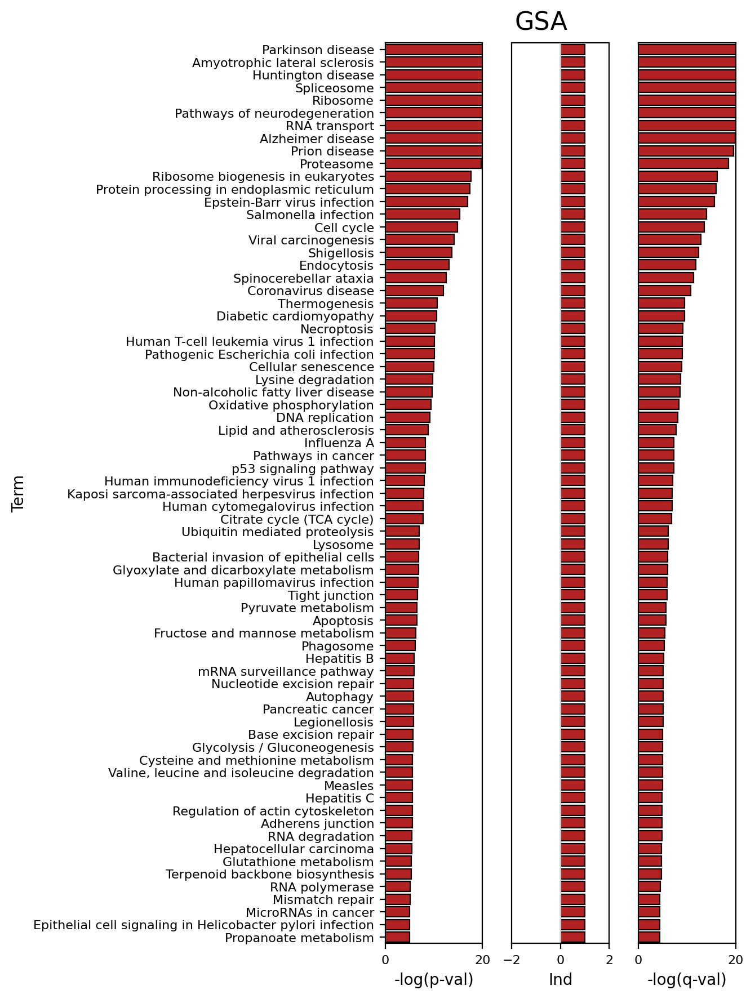

True

In [61]:
df_res = df_res_enr.copy(deep = True)
df_res = df_res.loc[df_res['-log(p-val)'] >= 5 ]

terms_sel = list(df_res.index.values)
items_to_plot = ['-log(p-val)', 'Ind', '-log(q-val)'] # , 'NES'
lims = [[0, 20], [-2, 2], [0, 20]] # , [-5, 5]

df_res = df_res.sort_values(by = '-log(p-val)', ascending = False)

plot_gsea_res( df_res, terms_sel, items_to_plot, lims, title = 'GSA',
               title_pos = (0.5, 1), title_fs = 16, title_ha = 'center',
               Ax = None)

### plot GSEA results

In [62]:
df_dct_prerank = adata_t.uns['GSEA']
df_dct_prerank.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [63]:
target_cell = 'Epithelial cell'
df_dct_prerank[target_cell].keys()

dict_keys(['ER+_vs_others', 'TNBC_vs_others'])

In [64]:
df_res_pr = df_dct_prerank[target_cell]['TNBC_vs_others']
df_res_pr

,Name,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,-log(p-val),-log(q-val),Term
Term,,,,,,,,,,,,
Ether lipid metabolism,prerank,0.806743,1.713417,0.012570,1.000000,0.607,6/14,8.81%,UGT8;PLA2G7;LPCAT2;PLPP3;PLA2G2A;PLD1,1.900671,-0.000000,Ether lipid metabolism
Viral protein interaction with cytokine and cytokine receptor,prerank,0.764107,1.680330,0.013333,1.000000,0.792,10/20,10.47%,CX3CL1;CXCL1;CXCL3;IL2RG;CXCL2;CXCL8;IL34;IL6R...,1.875061,-0.000000,Viral protein interaction with cytokine and cy...
Glycosphingolipid biosynthesis,prerank,0.804612,1.679010,0.015342,0.711878,0.798,4/14,4.32%,B3GNT5;B3GNT3;FUT3;ST8SIA1,1.814126,0.147594,Glycosphingolipid biosynthesis
Neuroactive ligand-receptor interaction,prerank,0.715590,1.647450,0.028395,0.833174,0.906,14/26,11.14%,GABRP;TACR1;CHRM3;P2RY6;NMB;ADORA1;CHRNA5;NPW;...,1.546757,0.079264,Neuroactive ligand-receptor interaction
Staphylococcus aureus infection,prerank,0.762152,1.617115,0.018792,0.968318,0.964,6/17,5.69%,KRT17;DSG1;KRT14;KRT16;DEFB1;C1S,1.726028,0.013982,Staphylococcus aureus infection
Thiamine metabolism,prerank,0.814058,1.555635,0.085803,1.000000,0.995,1/6,0.59%,AK5,1.066495,-0.000000,Thiamine metabolism
Wnt signaling pathway,prerank,0.631017,1.544012,0.032895,1.000000,0.996,12/59,10.18%,SFRP1;MMP7;RSPO3;DKK1;WNT6;TCF7L1;PRICKLE1;TCF...,1.482874,-0.000000,Wnt signaling pathway
Morphine addiction,prerank,0.702558,1.533967,0.069554,1.000000,0.997,10/20,15.06%,GABRP;GNG4;GNAI1;GNGT1;ADORA1;PRKACB;PDE4B;ARR...,1.157679,-0.000000,Morphine addiction
Cysteine and methionine metabolism,prerank,0.682182,1.533708,0.059829,1.000000,0.997,4/26,4.64%,PSAT1;CDO1;LDHB;PHGDH,1.223088,-0.000000,Cysteine and methionine metabolism


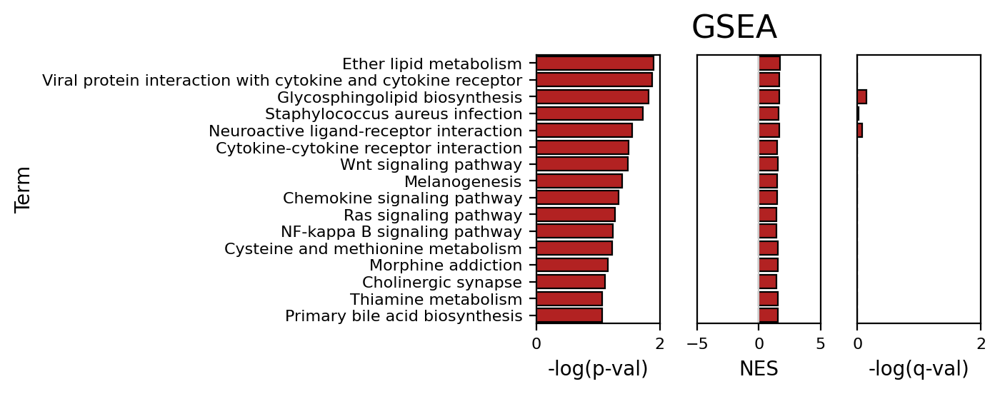

True

In [65]:
df_res = df_res_pr.copy(deep = True)
terms_sel = list(df_res.index.values)
items_to_plot = ['-log(p-val)', 'NES', '-log(q-val)']
lims = [[0, 2], [-5, 5], [0, 2]]

df_res = df_res.sort_values(by = '-log(p-val)', ascending = False)

plot_gsea_res( df_res, terms_sel, items_to_plot, lims, title = 'GSEA',
               title_pos = (0.5, 1), title_fs = 16, title_ha = 'center',
               Ax = None)

### plot GSEA summary

In [66]:
gsea_res = adata_t.uns['GSEA']
gsea_res.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [67]:
df_qv, df_es = get_gsea_summary(gsea_res, max_log_p = 10)

,Epithelial cell: ER+_vs_others,Epithelial cell: TNBC_vs_others,Fibroblast: ER+_vs_others,Fibroblast: TNBC_vs_others,Macrophage: ER+_vs_others,Macrophage: TNBC_vs_others,Plasma cell: ER+_vs_others,Plasma cell: TNBC_vs_others,T cell CD4+: ER+_vs_others,T cell CD4+: TNBC_vs_others,T cell CD8+: ER+_vs_others,T cell CD8+: TNBC_vs_others
p53 signaling pathway,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,20.000000,2.959995
Yersinia infection,0.000000,0.000000,0.000000,0.000000,1.764923,1.851258,0.0,0.0,0.0,0.0,0.000000,0.000000
Wnt signaling pathway,1.704722,1.482874,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000
Viral protein interaction with cytokine and cytokine receptor,1.764004,1.875061,1.070428,1.091614,0.000000,0.000000,0.0,0.0,0.0,0.0,1.102662,1.032529
Vascular smooth muscle contraction,0.000000,0.000000,1.580735,1.499023,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000


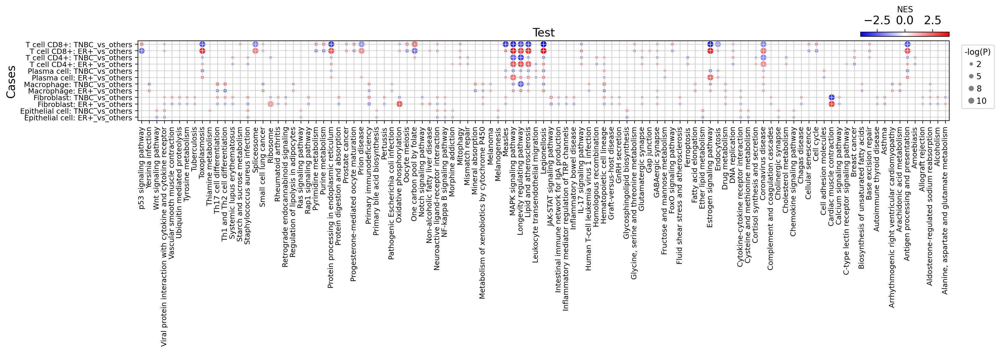

In [68]:
plot_gsea_all( df_qv, df_es, title = 'Test', title_fs = 14, 
               tick_fs = 9, tick_rot = 90, tick_ha = 'center',
               label_fs = 10, legend_fs = 10, swap_ax = True, 
               dot_size = 40, fig_size_sf = 1 )

## 추가 진행할 것
1. Tumor identification한 후, celltype_minor_rev 정리 어떻게 할지 -> DEG에서 Tumor/Epi 비교 가능하게
2. plot_gsea_all 보완
3. Tumor identification에서 edge weight를 모든 seed cluster에 대해 count?
4. Tumor identification summary (cnv_addon_summary)에 edge weight 가장 큰 pair cluster 정보 추가 